- https://github.com/infusedIdeas/ai_software_dev/blob/master/AI/APIs/Sensor%20Anomaly%20Detection%20-%20Streaming%20Model/Sensor%20Anomaly%20Detection%20-%20Streaming%20Model.ipynb
- https://towardsdatascience.com/lstm-autoencoder-for-anomaly-detection-e1f4f2ee7ccf
- np.ttf 공식 페이지 : https://docs.scipy.org/doc/numpy-1.13.0/reference/routines.fft.html
- Fourier Transformation 설명 :  https://darkpgmr.tistory.com/171

- ### dataset
    - NASA 음향 및 진동 데이터베이스의 진동 센서
    - NASA 연구에서는 여러 날 동안 일정한 부하를 받는 상태에서 고장 날 수 있는 4개의 베어링에 대한 센서 수치를 측정했다. 
    - 데이터 세트는 10분 간격으로 기록된 1초 진동 신호 스냅샷인 개별 파일로 구성되어 있다. 
    - 각 파일에는 20kHz의 샘플링 속도로 베어링 센서를 판독하여 얻은 베어링당 20,480개의 센서 데이터 포인트가 포함되어 있다.
    - 정리 : 10분 간격으로 1초씩 4개의 센서 데이터 수집, 1초당 20,480개의 데이터가 있음, 총 982개의 파일 : 982 * 20480 = 20,111,360 개
    - dataset link : https://github.com/infusedIdeas/ai_software_dev/tree/master/AI/APIs/Sensor%20Anomaly%20Detection%20-%20Streaming%20Model

- ### 문제 : 미래에 생길 고장을 예측

In [1]:
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.externals import joblib
import seaborn as sns
sns.set(color_codes = True)
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings(action='ignore')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


In [2]:
from numpy.random import seed
import tensorflow as tf

In [3]:
from keras.layers import Input, Dropout, Dense, LSTM, TimeDistributed, RepeatVector
from keras.models import Model
from keras import regularizers

Using TensorFlow backend.


In [4]:
seed(10)

- Idea
    - 가정 : 베어링의 기계적 저하가 시간이 지남에 따라 점진적으로 발생한다는 것이다. 
    - 각 10분 데이터 파일 센서 판독값은 20,480개의 데이터 연결부에서 진동 기록의 평균 절대값을 사용하여 집계된다.

In [5]:
data_dir = '/Users/jinholee/Documents/모두의연구소/kaggle/191218_내_발표자료/data'
merged_data = pd.DataFrame()

for filename in os.listdir(data_dir):
    dataset = pd.read_csv(os.path.join(data_dir, filename), sep = '\t', header = None)
    dataset_mean_abs = np.array(dataset.abs().mean()) # 절대값을 취한 후 평균
    dataset_mean_abs = pd.DataFrame(dataset_mean_abs.reshape(1,4))
    dataset_mean_abs.index = [filename] # 절대값의 평균값을 구한 후 그 값의 index 를 파일명으로 바꾸기
    merged_data = merged_data.append(dataset_mean_abs)
    
merged_data.columns = ['Bearing 1', 'Bearing 2', 'Bearing 3', 'Bearing 4']

In [6]:
# dataset 확인 : jh
dataset.head()

,0,1,2,3
0,-0.144,-0.100,0.037,0.110
1,-0.205,0.017,0.051,0.037
2,0.000,-0.098,0.112,-0.029
3,0.056,-0.032,-0.127,-0.027
4,-0.098,0.105,-0.029,-0.063


In [7]:
# 데이터 확인 : jh
# dataset_mean_abs 는 dataset 를 bearing 별로 절대값의 평균을 계산한 결과
dataset_mean_abs.head()

,0,1,2,3
2004.02.18.04.02.39,0.10005,0.079847,0.081559,0.049527


In [8]:
# transform data file index to datetime and sort in chronological order
merged_data.index = pd.to_datetime(merged_data.index, format='%Y.%m.%d.%H.%M.%S')
merged_data = merged_data.sort_index()
#merged_data.to_csv('Averaged_BearingTest_Dataset.csv')
print("Dataset shape:", merged_data.shape)
merged_data.head()

Dataset shape: (982, 4)


,Bearing 1,Bearing 2,Bearing 3,Bearing 4
2004-02-12 10:52:39,0.060239,0.074223,0.083922,0.044442
2004-02-12 11:02:39,0.061453,0.073843,0.084462,0.045081
2004-02-12 11:12:39,0.061361,0.075606,0.082837,0.045118
2004-02-12 11:22:39,0.061669,0.073281,0.084886,0.044171
2004-02-12 11:32:39,0.061944,0.074592,0.082623,0.044658


- ### training data 와 test data 를 시간 순서로 나누자

In [9]:
train = merged_data['2004-02-12 10:52:39': '2004-02-15 12:52:39']
test = merged_data['2004-02-15 12:52:39':]
print("Training dataset shape:", train.shape)
print("Test dataset shape:", test.shape)

Training dataset shape: (445, 4)
Test dataset shape: (538, 4)


- ### Bearing 별로 추세를 그래프로 살펴보자

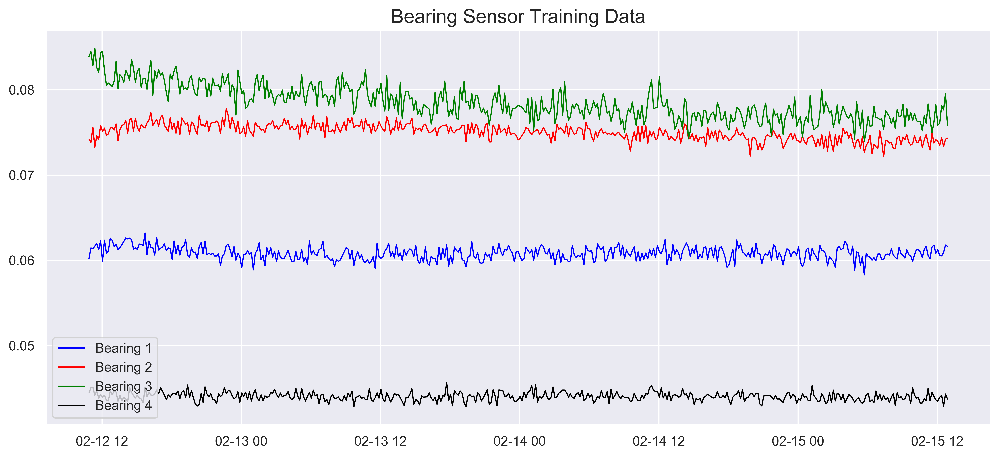

In [10]:
fig, ax = plt.subplots(figsize=(14, 6), dpi = 800)

ax.plot(train['Bearing 1'], label='Bearing 1', color='blue',  animated = True, linewidth=1)
ax.plot(train['Bearing 2'], label='Bearing 2', color='red' ,  animated = True, linewidth=1)
ax.plot(train['Bearing 3'], label='Bearing 3', color='green', animated = True, linewidth=1)
ax.plot(train['Bearing 4'], label='Bearing 4', color='black', animated = True, linewidth=1)

plt.legend(loc = 'lower left')

ax.set_title('Bearing Sensor Training Data', fontsize = 16)

plt.show()

- ### discrete Fourier Transformation 을 사용하여 시간 영역에서 주파수 영역으로 신호를 변환함으로써 데이터에 대한 다른 관점을 가져 보자.

- ### discrete Fourier Transformation 에 대해 알아보자

- ### definition of discrete Fourier Transformation 

The discrete Fourier transform transforms a sequence of N complex numbers ${\displaystyle \left\{\mathbf {x_{n}} \right\}:=x_{0},x_{1},\ldots ,x_{N-1}}$ into another sequence of complex numbers, 
${\displaystyle \left\{\mathbf {X_{k}} \right\}:=X_{0},X_{1},\ldots ,X_{N-1},}$ which is defined by

$$
X_k 
= \sum_{n=0}^{N-1} x_c \cdot e^{-{{i2\pi}\over N}kn} 
= \sum_{n=0}^{N-1}x_n \cdot \left[ \cos \left( {{2\pi}\over N}kn \right) - i \cdot \sin  \left( {{2\pi}\over N}kn \right)\right]
$$

- ### An example of DFT

Let $N=4$ and
$\mathbf{x} =
\begin{pmatrix}
x_0 \\ x_1 \\ x_2 \\ x_3
\end{pmatrix}
=
\begin{pmatrix}
1 \\ 2-i \\ -i \\ -1+2i
\end{pmatrix}
$

위의 정의에 의해 DFT 의 결과를 얻을 수 있다.

$X_0 = e^{-i 2 \pi 0 \cdot 0 / 4} \cdot 1 + e^{-i 2 \pi 0 \cdot 1 / 4} \cdot (2-i) + e^{-i 2 \pi 0 \cdot 2 / 4} \cdot (-i) + e^{-i 2 \pi 0 \cdot 3 / 4} \cdot (-1+2i) = 2$

$X_1 = e^{-i 2 \pi 1 \cdot 0 / 4} \cdot 1 + e^{-i 2 \pi 1 \cdot 1 / 4} \cdot (2-i) + e^{-i 2 \pi 1 \cdot 2 / 4} \cdot (-i) + e^{-i 2 \pi 1 \cdot 3 / 4} \cdot (-1+2i) = -2-2i$

$X_2 = e^{-i 2 \pi 2 \cdot 0 / 4} \cdot 1 + e^{-i 2 \pi 2 \cdot 1 / 4} \cdot (2-i) + e^{-i 2 \pi 2 \cdot 2 / 4} \cdot (-i) + e^{-i 2 \pi 2 \cdot 3 / 4} \cdot (-1+2i) = -2i$

$X_3 = e^{-i 2 \pi 3 \cdot 0 / 4} \cdot 1 + e^{-i 2 \pi 3 \cdot 1 / 4} \cdot (2-i) + e^{-i 2 \pi 3 \cdot 2 / 4} \cdot (-i) + e^{-i 2 \pi 3 \cdot 3 / 4} \cdot (-1+2i) = 4+4i$


- ### numpy 로 1, 2-i, -i, -2+2i 의 DFT 을 계산해 보면 동일한 결과를 얻을 수 있다.
- np.fft.fft 는 one-dimensional discrete Fourier Transform 를 계산해 주는 함수이다

In [11]:
np.fft.fft([1, 2-1.j, -1.j, -1+2.j])

array([ 2.+0.j, -2.-2.j,  0.-2.j,  4.+4.j])

- ### 데이터를 DFT 를 이용하여 변환해 보자.

In [12]:
train_fft = np.fft.fft(train)
test_fft  = np.fft.fft(test)

In [13]:
# 값 체크 : jh
train.iloc[0:5]

,Bearing 1,Bearing 2,Bearing 3,Bearing 4
2004-02-12 10:52:39,0.060239,0.074223,0.083922,0.044442
2004-02-12 11:02:39,0.061453,0.073843,0.084462,0.045081
2004-02-12 11:12:39,0.061361,0.075606,0.082837,0.045118
2004-02-12 11:22:39,0.061669,0.073281,0.084886,0.044171
2004-02-12 11:32:39,0.061944,0.074592,0.082623,0.044658


In [14]:
# 값 체크 : jh
np.fft.fft(train.iloc[0])

array([ 0.26282666+0.j        , -0.02368325-0.02978149j,
        0.0254957 +0.j        , -0.02368325+0.02978149j])

In [15]:
# 값 체크 : jh
train_fft[0]

array([ 0.26282666+0.j        , -0.02368325-0.02978149j,
        0.0254957 +0.j        , -0.02368325+0.02978149j])

- train_fft[:,0] 의 의미 체크

In [16]:
train_fft[0][0], train_fft[1][0], train_fft[2][0]

((0.2628266601562472+0j), (0.2648398925781234+0j), (0.26492241210937395+0j))

In [17]:
#train_fft[:,0].real
train_fft[:,0][:10]

array([0.26282666+0.j, 0.26483989+0.j, 0.26492241+0.j, 0.26400537+0.j,
       0.26381792+0.j, 0.26126304+0.j, 0.26673623+0.j, 0.26348589+0.j,
       0.26428306+0.j, 0.25964502+0.j])

- 즉, train_fft[:,0] 는 train_fft[i] 에서 첫 좌표의 값만 가져오는 것이다(참고로 train_fft[i] 는 4차원 벡터이다)

- 참고로 train 에서 4개를 모두 쓰지 않고, 3개만 사용하면 당연히 값이 달라진다.
    - 마치 4개의 points 를 가지고 linear regression 을 한 결과가 하나의 점을 더 추가하여 4개의 points 를 사용하여 linear regression 한 결과와 다른것과 같은 의미이다

In [18]:
train.iloc[0][0:3].values

array([0.06023896, 0.07422349, 0.08392222])

In [19]:
np.fft.fft(train.iloc[0][0:3].values)

array([ 0.21838467+0.j        , -0.01883389+0.00839935j,
       -0.01883389-0.00839935j])

- ### 결과를 그래프 그려보았다. $x$ 는 데이터의 순서를 1, 2, 3, 4 로 표현했고, $y$ 는 절대값이다

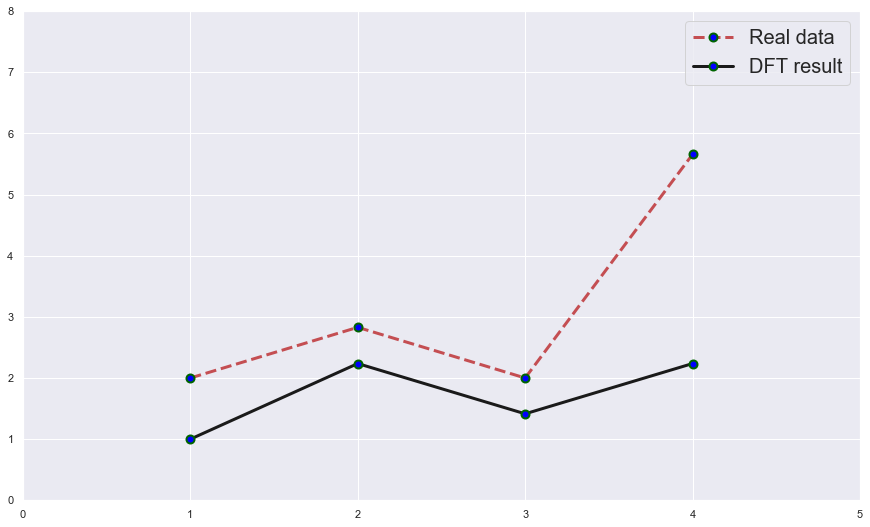

In [20]:
import numpy as np
import matplotlib.pyplot as plt
 
fig = plt.figure(figsize=(15,9))
ax = fig.add_subplot(1,1,1)
ax.set(xlim = [0, 5], ylim = [0,8])

line_original, = ax.plot([1,2,3,4], [1,np.sqrt(5),np.sqrt(2),np.sqrt(5)])

line_original.set(color='k',
         linewidth=3, linestyle='-',
         marker='o', markersize=8, markeredgewidth=2,
         markerfacecolor='blue', markeredgecolor='darkgreen')

line, = ax.plot([1,2,3,4], [2,2*np.sqrt(2),2,4*np.sqrt(2)])

line.set(color='r',
         linewidth=3, linestyle='--',
         marker='o', markersize=8, markeredgewidth=2,
         markerfacecolor='blue', markeredgecolor='darkgreen')

plt.legend([line, line_original], ['Real data', 'DFT result'], prop={'size': 20})
plt.show()

- ### Trainging 데이터의 DFT 결과

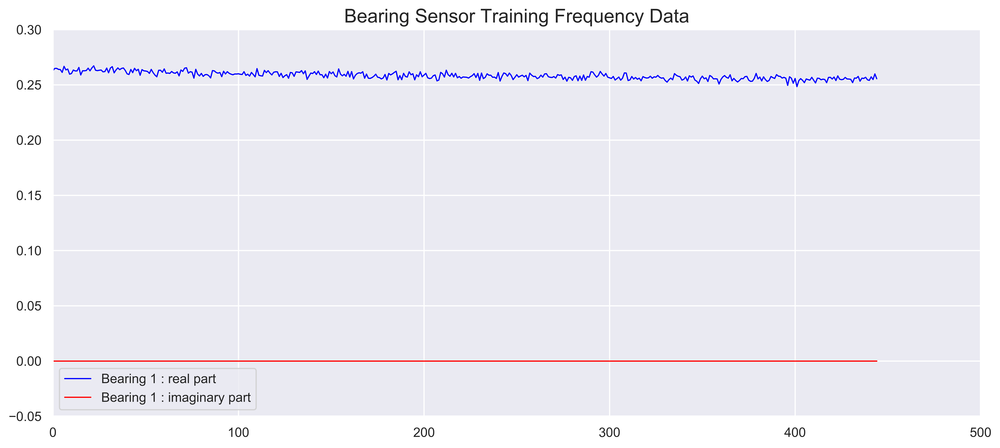

In [21]:
# frequencies of the healthy sensor signal
fig, ax = plt.subplots(figsize=(14, 6), dpi=800)

ax.set(xlim=[0, 500], ylim=[-0.05,0.3])

ax.plot(train_fft[:,0].real, label='Bearing 1 : real part', color='blue',  animated = True, linewidth=1)
ax.plot(train_fft[:,0].imag, label='Bearing 1 : imaginary part', color='red',  animated = True, linewidth=1)

plt.legend(loc='lower left')

ax.set_title('Bearing Sensor Training Frequency Data', fontsize=16)

plt.show()

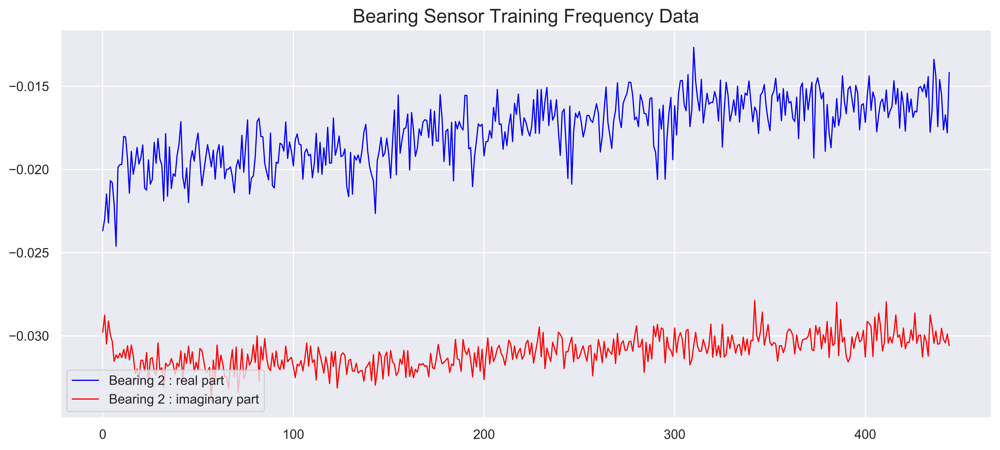

In [22]:
# frequencies of the healthy sensor signal
fig, ax = plt.subplots(figsize=(14, 6), dpi=800)

ax.plot(train_fft[:,1].real, label='Bearing 2 : real part', color='blue',  animated = True, linewidth=1)
ax.plot(train_fft[:,1].imag, label='Bearing 2 : imaginary part', color='red',  animated = True, linewidth=1)

plt.legend(loc='lower left')

ax.set_title('Bearing Sensor Training Frequency Data', fontsize=16)

plt.show()

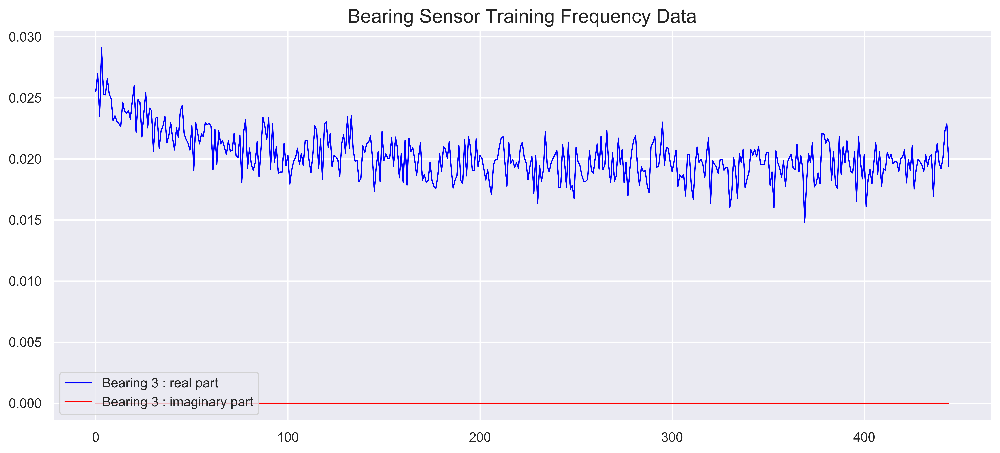

In [23]:
# frequencies of the healthy sensor signal
fig, ax = plt.subplots(figsize=(14, 6), dpi=800)

ax.plot(train_fft[:,2].real, label='Bearing 3 : real part', color='blue',  animated = True, linewidth=1)
ax.plot(train_fft[:,2].imag, label='Bearing 3 : imaginary part', color='red',  animated = True, linewidth=1)

plt.legend(loc='lower left')

ax.set_title('Bearing Sensor Training Frequency Data', fontsize=16)

plt.show()

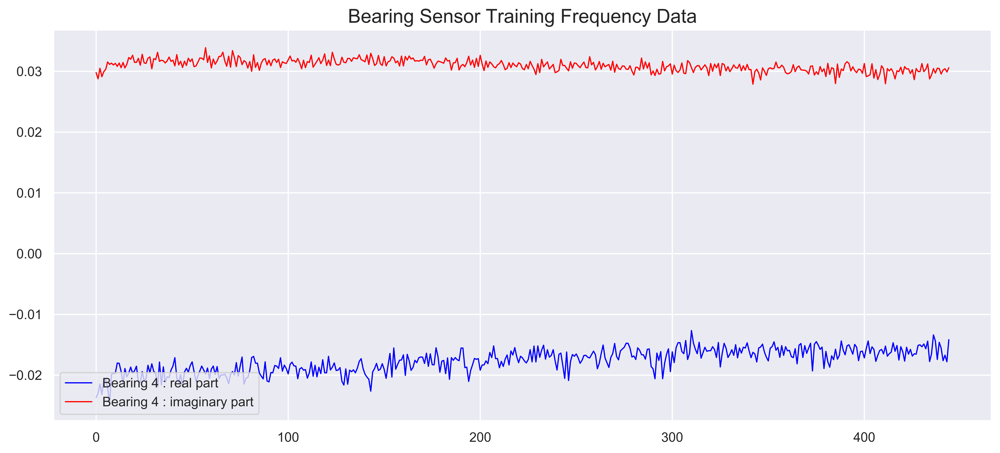

In [24]:
# frequencies of the healthy sensor signal
fig, ax = plt.subplots(figsize=(14, 6), dpi=800)

ax.plot(train_fft[:,3].real, label='Bearing 4 : real part', color='blue',  animated = True, linewidth=1)
ax.plot(train_fft[:,3].imag, label='Bearing 4 : imaginary part', color='red',  animated = True, linewidth=1)

plt.legend(loc='lower left')

ax.set_title('Bearing Sensor Training Frequency Data', fontsize=16)

plt.show()

- ### Test 데이터의 DFT 결과

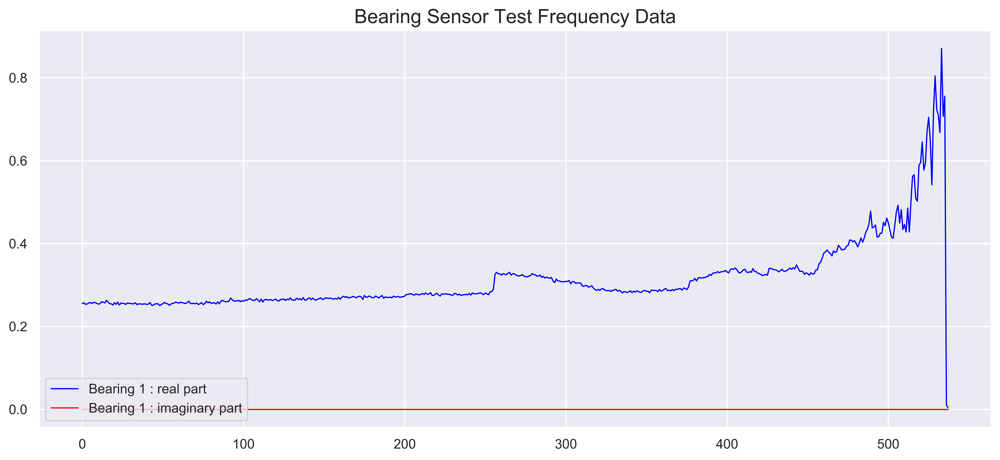

In [25]:
# frequencies of the degrading sensor signal
fig, ax = plt.subplots(figsize=(14, 6), dpi=800)

ax.plot(test_fft[:,0].real, label='Bearing 1 : real part', color='blue', animated = True, linewidth=1)
ax.plot(test_fft[:,0].imag, label='Bearing 1 : imaginary part', color='red', animated = True, linewidth=1)

plt.legend(loc='lower left')

ax.set_title('Bearing Sensor Test Frequency Data', fontsize=16)

plt.show()

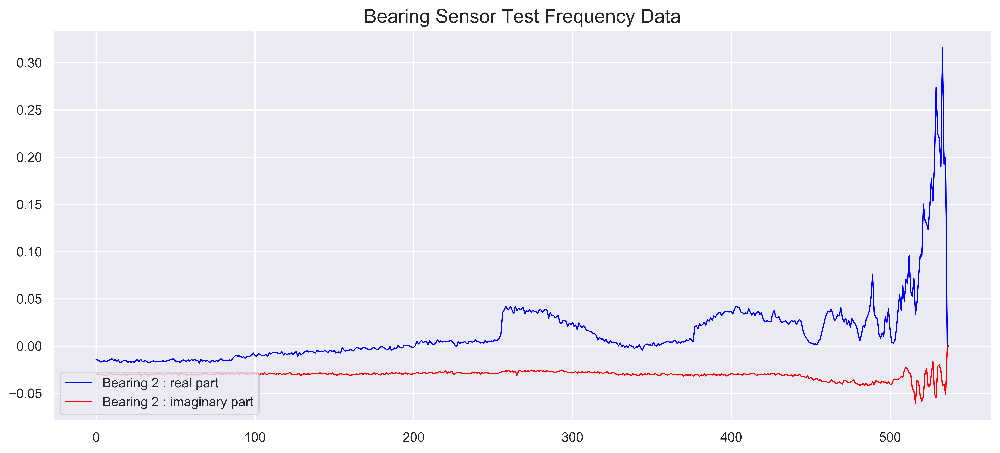

In [26]:
# frequencies of the degrading sensor signal
fig, ax = plt.subplots(figsize=(14, 6), dpi=800)

ax.plot(test_fft[:,1].real, label='Bearing 2 : real part', color='blue', animated = True, linewidth=1)
ax.plot(test_fft[:,1].imag, label='Bearing 2 : imaginary part', color='red', animated = True, linewidth=1)

plt.legend(loc='lower left')

ax.set_title('Bearing Sensor Test Frequency Data', fontsize=16)

plt.show()

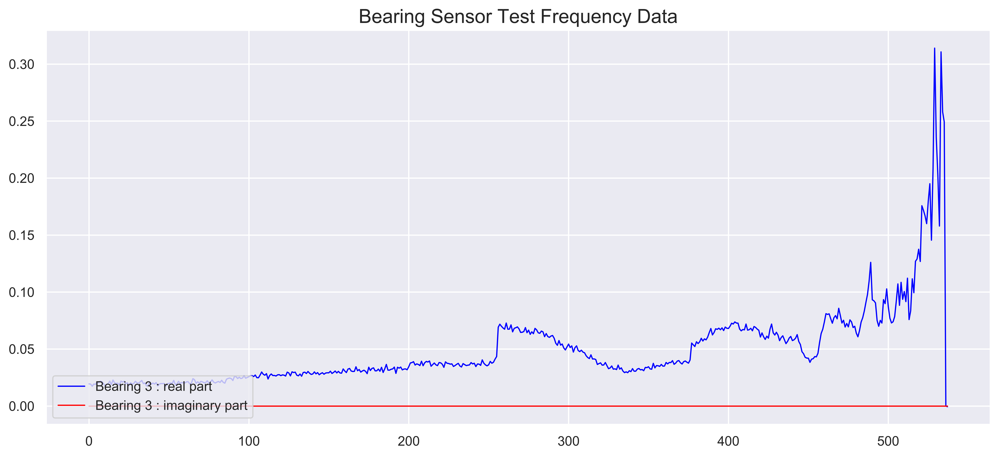

In [27]:
# frequencies of the degrading sensor signal
fig, ax = plt.subplots(figsize=(14, 6), dpi=800)

ax.plot(test_fft[:,2].real, label='Bearing 3 : real part', color='blue', animated = True, linewidth=1)
ax.plot(test_fft[:,2].imag, label='Bearing 3 : imaginary part', color='red', animated = True, linewidth=1)

plt.legend(loc='lower left')

ax.set_title('Bearing Sensor Test Frequency Data', fontsize=16)

plt.show()

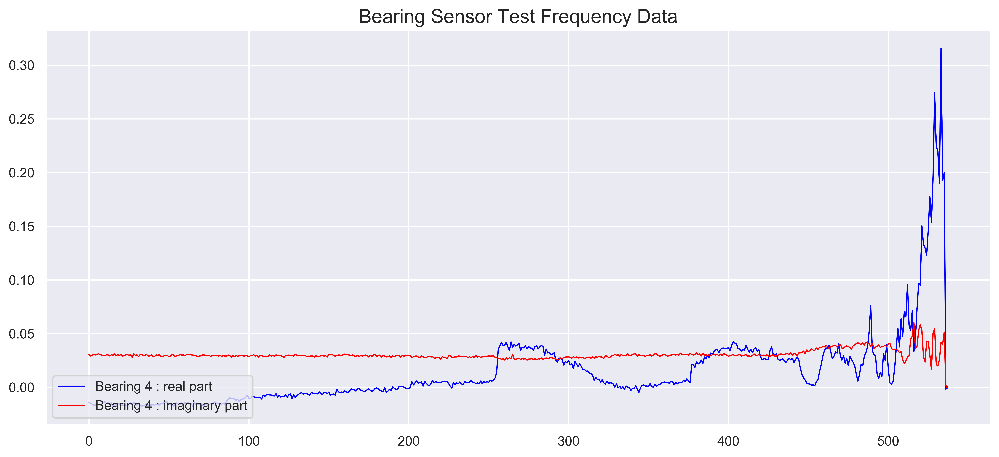

In [28]:
# frequencies of the degrading sensor signal
fig, ax = plt.subplots(figsize=(14, 6), dpi=800)

ax.plot(test_fft[:,3].real, label='Bearing 4 : real part', color='blue', animated = True, linewidth=1)
ax.plot(test_fft[:,3].imag, label='Bearing 4 : imaginary part', color='red', animated = True, linewidth=1)

plt.legend(loc='lower left')

ax.set_title('Bearing Sensor Test Frequency Data', fontsize=16)

plt.show()

- ### Min Max scaler 를 사용해서 크기를 normalizing 하자

In [29]:
scaler = MinMaxScaler()

X_train = scaler.fit_transform(train)
X_test = scaler.transform(test)

scaler_filename = "scaler_data"

joblib.dump(scaler, scaler_filename)

['scaler_data']

- LSTM 에 넣기 위해 데이터를 수정하자. 
- 그래프상 전체 데이터에 주기(period) 가 없으므로 timesteps 는 1 을 넣자
- 참고자료 : https://datascienceschool.net/view-notebook/1d93b9dc6c624fbaa6af2ce9290e2479/

In [30]:
# reshape inputs for LSTM [samples, timesteps, features]
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
print("Training data shape:", X_train.shape)
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
print("Test data shape:", X_test.shape)

Training data shape: (445, 1, 4)
Test data shape: (538, 1, 4)


- ### model architecture 는 다음과 같다

In [31]:
def autoencoder_model(X):
    
    inputs = Input(shape=(X.shape[1], X.shape[2])) # X_train.shape[1] = 1, X_train.shape[2] = 4
    
    L1 = LSTM(16, activation='relu', return_sequences=True, 
              kernel_regularizer=regularizers.l2(0.00))(inputs)
    
    L2 = LSTM(4, activation='relu', return_sequences=False)(L1)
    
    L3 = RepeatVector(X.shape[1])(L2)
    
    L4 = LSTM(4, activation='relu', return_sequences=True)(L3)
    
    L5 = LSTM(16, activation='relu', return_sequences=True)(L4)
    
    output = TimeDistributed(Dense(X.shape[2]))(L5)    
    
    model = Model(inputs=inputs, outputs=output)
    
    return model

- ### LSTM layer 들로 구성되어 있고, L3 를 기준으로 dimension 이 대칭되게 구성하여 autoencoder 라고 표현한 것 같다

In [32]:
model = autoencoder_model(X_train)
model.compile(optimizer='adam', loss='mae')
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 1, 4)              0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 1, 16)             1344      
_________________________________________________________________
lstm_2 (LSTM)                (None, 4)                 336       
_________________________________________________________________
repeat_vector_1 (RepeatVecto (None, 1, 4)              0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 1, 4)              144       
_________________________________________________________________
lstm_4 (LSTM)                (None, 1, 16)             1344      
_________________________________________________________________
time_distributed_1 (TimeDist (None, 1, 4)              68  

- ### 학습단계

    - #### epoch = 100
    - #### batch size = 10
    - #### validation split = 0.05 : Training 데이터에서 5% 를 validation data 로 사용하여 학습

In [33]:
nb_epochs = 100
batch_size = 10
history = model.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                    validation_split=0.05).history

Train on 422 samples, validate on 23 samples
Epoch 1/100
422/422 [==============================] - 2s 4ms/step - loss: 0.4456 - val_loss: 0.3199
Epoch 2/100
422/422 [==============================] - 0s 345us/step - loss: 0.3824 - val_loss: 0.2477
Epoch 3/100
422/422 [==============================] - 0s 328us/step - loss: 0.2904 - val_loss: 0.1643
Epoch 4/100
422/422 [==============================] - 0s 304us/step - loss: 0.1585 - val_loss: 0.1197
Epoch 5/100
422/422 [==============================] - 0s 305us/step - loss: 0.1123 - val_loss: 0.1179
Epoch 6/100
422/422 [==============================] - 0s 314us/step - loss: 0.1030 - val_loss: 0.1195
Epoch 7/100
422/422 [==============================] - 0s 308us/step - loss: 0.1019 - val_loss: 0.1177
Epoch 8/100
422/422 [==============================] - 0s 318us/step - loss: 0.1016 - val_loss: 0.1178
Epoch 9/100
422/422 [==============================] - 0s 313us/step - loss: 0.1011 - val_loss: 0.1161
Epoch 10/100
422/422 [========

422/422 [==============================] - 0s 330us/step - loss: 0.0941 - val_loss: 0.0947
Epoch 80/100
422/422 [==============================] - 0s 312us/step - loss: 0.0939 - val_loss: 0.0937
Epoch 81/100
422/422 [==============================] - 0s 307us/step - loss: 0.0939 - val_loss: 0.0959
Epoch 82/100
422/422 [==============================] - 0s 307us/step - loss: 0.0938 - val_loss: 0.0939
Epoch 83/100
422/422 [==============================] - 0s 306us/step - loss: 0.0939 - val_loss: 0.0948
Epoch 84/100
422/422 [==============================] - 0s 304us/step - loss: 0.0939 - val_loss: 0.0961
Epoch 85/100
422/422 [==============================] - 0s 294us/step - loss: 0.0938 - val_loss: 0.0948
Epoch 86/100
422/422 [==============================] - 0s 299us/step - loss: 0.0940 - val_loss: 0.0946
Epoch 87/100
422/422 [==============================] - 0s 308us/step - loss: 0.0939 - val_loss: 0.0953
Epoch 88/100
422/422 [==============================] - 0s 307us/step - loss:

- ### Train Loss 와 Validation Loss 가 유사하게 감소하여 잘 학습된 것을 확인할 수 있다

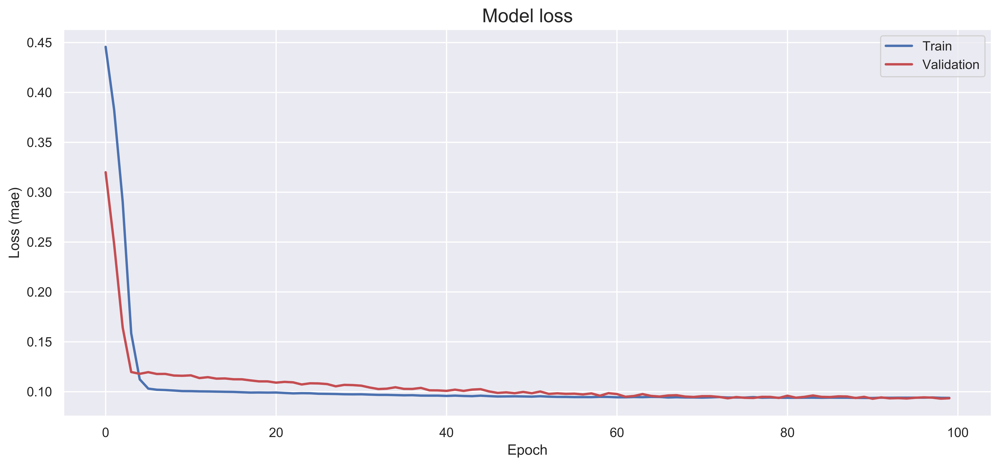

In [34]:
fig, ax = plt.subplots(figsize=(14, 6), dpi=800)

ax.plot(history['loss'], 'b', label='Train', linewidth=2)
ax.plot(history['val_loss'], 'r', label='Validation', linewidth=2)

ax.set_title('Model loss', fontsize=16)

ax.set_ylabel('Loss (mae)')
ax.set_xlabel('Epoch')

ax.legend(loc='upper right')

plt.show()

- ### Distribution of Loss Function

그래프를 그려서 anomaly 데이터에 대한 적절한 threshold 을 학인할 수 있다. Loss 는 위의 LSTM Autoencoder 모델의 결과와 실제값의 차이의 MAE 값이고, 20 개로 binning 그래프로 표현하였다.

(0.0, 0.5)

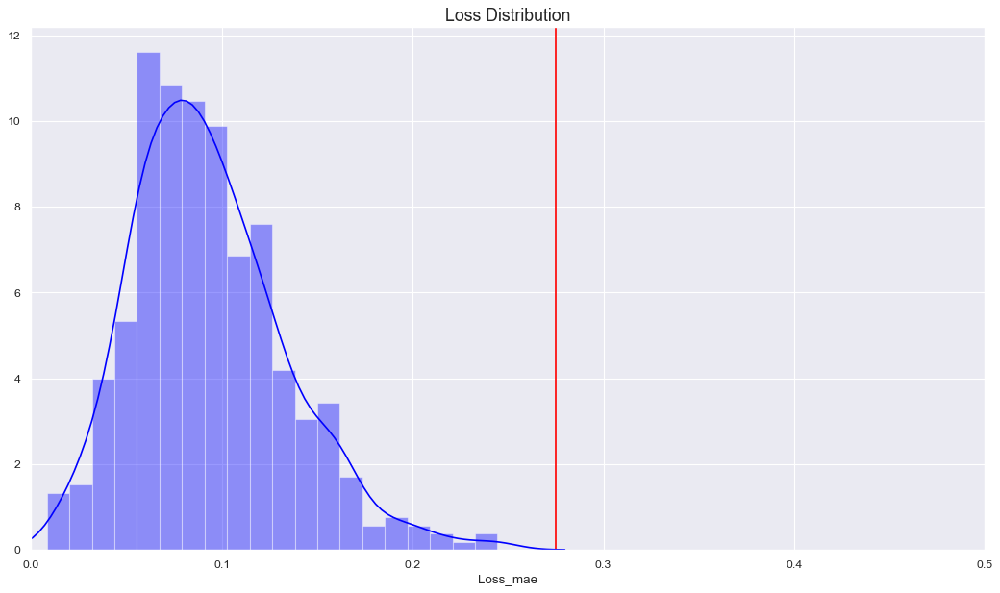

In [35]:
X_pred = model.predict(X_train)
X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
X_pred = pd.DataFrame(X_pred, columns=train.columns)
X_pred.index = train.index

scored = pd.DataFrame(index=train.index)
Xtrain = X_train.reshape(X_train.shape[0], X_train.shape[2])

# 모델 결과(X_pred) 와 실제값(Xtrain) 의 MAE 를 Loss_man 로 정의하자
scored['Loss_mae'] = np.mean(np.abs(X_pred - Xtrain), axis = 1)

plt.figure(figsize=(16,9), dpi=80)
plt.title('Loss Distribution', fontsize=16)

# threshold
plt.axvline(x=0.275, color = 'red') 

sns.distplot(scored['Loss_mae'], bins = 20, kde= True, color = 'blue');
plt.xlim([0.0,.5])

- 위의 Loss distribution 에 의해 0.275 를 anormaly 데이터의 threshold 로 정하였다. 이 값을 넘는 데이터를 Anomaly 컬럼에 True 로 표기하자.

In [36]:
X_pred = model.predict(X_test)
X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
X_pred = pd.DataFrame(X_pred, columns=test.columns)
X_pred.index = test.index

scored = pd.DataFrame(index=test.index)
Xtest = X_test.reshape(X_test.shape[0], X_test.shape[2])

scored['Loss_mae'] = np.mean(np.abs(X_pred - Xtest), axis = 1)

scored['Threshold'] = 0.275

# Loss_mae 가 anomaly 데이터의 threshold 인 0.275 보다 크면 Anomaly = True 라고 하자
scored['Anomaly'] = scored['Loss_mae'] > scored['Threshold']
scored.head()

,Loss_mae,Threshold,Anomaly
2004-02-15 12:52:39,0.092547,0.275,False
2004-02-15 13:02:39,0.173700,0.275,False
2004-02-15 13:12:39,0.061037,0.275,False
2004-02-15 13:22:39,0.053912,0.275,False
2004-02-15 13:32:39,0.040309,0.275,False


In [37]:
X_pred_train = model.predict(X_train)
X_pred_train = X_pred_train.reshape(X_pred_train.shape[0], X_pred_train.shape[2])
X_pred_train = pd.DataFrame(X_pred_train, columns=train.columns)
X_pred_train.index = train.index

scored_train = pd.DataFrame(index=train.index)
scored_train['Loss_mae'] = np.mean(np.abs(X_pred_train - Xtrain), axis = 1)
scored_train['Threshold'] = 0.275
scored_train['Anomaly'] = scored_train['Loss_mae'] > scored_train['Threshold']
scored = pd.concat([scored_train, scored])

- Threshold 를 넘는 Loss_mae 를 갖는 데이터를 그래프로 확인해 보자.

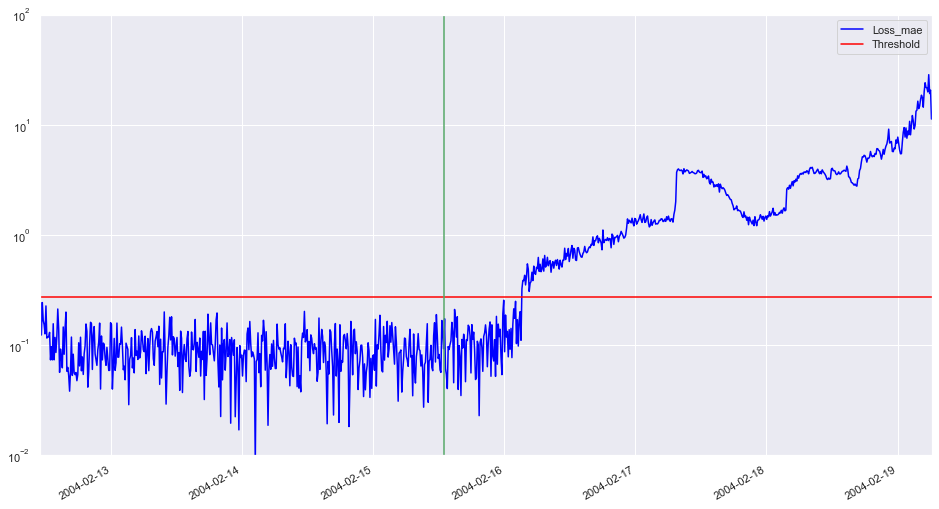

In [38]:
scored.plot(logy = True,  figsize = (16,9), ylim = [1e-2,1e2], color = ['blue','red'])

# train 데이터의 max index : train 데이터의 마지막 시간
plt.axvline(x=train.index.max(), color = 'g') 

- train 데이터와 test 데이터의 최대, 최소값을 체크하자

In [39]:
# save all model information, including weights, in h5 format
model.save("Cloud_model.h5")
print("Model saved")

Model saved
